## Detecting a behavior anomaly

The dataset below contains a location timeserie of a person living alone in their appartment. The data indicates in which location/room he was at which point in time. This data has been collected by sensors installed in the home. This person had a health incident in the night from 2019-09-18 to 2019-09-19, probably at 3:00 or 10:00 which shows in a drastic change in location behavior and resulted in the person going to hospital.

* By the sensor setup in the home, the location `entrance` and `livingroom` are really one single bigger room. Merge them.
* Explore the data and give an overview of key metrics (graphically and quantitatively)
* Can you say something about the living routines of the person?

Propose one or more methods to detect the incident in "real time" by analyzing the location data. Real-time means, that while time passes more and more of the data gets "known" to your detection method. It can trigger as soon as the incident is detected, an action can be triggered.

We are interested in understanding how you proceed in analyzing this case. 
* Show your thought process 
* What methods did you try and why
* What are their strength and weaknesses of the approaches. Are they robust and generalizable to other users?
* How do you test your code for correctness?

We are looking forward to your propositions!

PS: You are free to use other Python libraries as desired. Please return your Notebook as an answer.

# CRISP-DM Methodology
In this section we overview our selected method for engineering our solution.
CRISP-DM stands for Cross-Industry Standard Process for Data Mining. It is an open standard
guide that describes common approaches that are used by data mining experts. CRISP-DM
includes descriptions of the typical phases of a project, including tasks details and provides an
overview of the data mining lifecycle.
 The lifecycle model consists of six phases with arrows indicating the most important and
frequent dependencies between phases.
 The sequence of the phases is not strict. In fact, most projects move back and forth
between phases as necessary.
 It starts with business understanding, and then moves to data understanding, data preparation,
modelling, evaluation, and deployment.
 The CRISP-DM model is flexible and can be customized easily.

==>Our process to manage our project using the open standard CRISP-DM which will be more detailed in the rest of project phases.
#  1-Buissness Understanding

### Tasks

1. Determine business objectives
2. Assess situation
3. Determine data mining goals
4. Produce project plan

### Results

1.==>Detecting a behavior anomaly

2.==>The data indicates in which location/room he was at which point in time

  ==>This person had a health incident in the night from 2019-09-18 to 2019-09-19, probably at 3:00 or 10:00 which shows in a drastic change in location behavior and resulted in the person going to hospital.
  
3.==>the location `entrance` and `livingroom` are really one single bigger room. Merge them.

  ==>Explore the data and give an overview of key metrics (graphically and quantitatively)
  
  ==>Say something about the living routines of the person
  
  ==>Propose one or more methods to detect the incident in "real time" by analyzing the location data
  
# 2-Data Understanding 
 
### Tasks

1. Collect data
2. Describe data
3. Explore data
4. Verify data quality

### Results

#### Import time series


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk
from datetime import datetime
import pytz
import warnings
warnings.filterwarnings('ignore')
df = pd.read_pickle("C:/Users/rzouga/Downloads/Work Swiss/location-exploration/Recruitment-Challenge/locations.pkl")
df.head(5)

,customerLocationState,startTime,endTime,duration
100,bedroom,2018-06-01 23:34:51+02:00,2018-06-02 00:24:33+02:00,00:49:42
101,bathroom,2018-06-02 00:24:33+02:00,2018-06-02 00:31:36+02:00,00:07:03
102,bedroom,2018-06-02 00:31:36+02:00,2018-06-02 00:32:26+02:00,00:00:50
103,bathroom,2018-06-02 00:32:26+02:00,2018-06-02 00:32:41+02:00,00:00:15
104,bedroom,2018-06-02 00:32:41+02:00,2018-06-02 08:08:18+02:00,07:35:37


#### Profile report

In [2]:
import pandas_profiling
import numpy as np
#Generate profile report using pandas_profiling
report_df = pandas_profiling.ProfileReport(df)
#To display the report in a Jupyter notebook
report_df

Number of variables,5
Number of observations,38864
Total Missing (%),0.0%
Total size in memory,1.5 MiB
Average record size in memory,40.0 B
Numeric,1
Categorical,4
Boolean,0
Date,0
Text (Unique),0
Rejected,0


#### Data Insights

In [3]:
df.shape 

(38864, 4)

#### The  Period of tracking our  the period of tracking our person
==>as you see w have a data set of **486 days 13:34:05** 

In [4]:
Period= df.duration.sum()
Period

Timedelta('486 days 13:34:05')

In [5]:
df.columns.values 

array(['customerLocationState', 'startTime', 'endTime', 'duration'],
      dtype=object)

dataset comprises of **38864 observations and 4 chracteriestics**


In [6]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38864 entries, 100 to 38963
Data columns (total 4 columns):
customerLocationState    38864 non-null object
startTime                38864 non-null datetime64[ns, Europe/Zurich]
endTime                  38863 non-null datetime64[ns, Europe/Zurich]
duration                 38863 non-null timedelta64[ns]
dtypes: datetime64[ns, Europe/Zurich](2), object(1), timedelta64[ns](1)
memory usage: 1.2+ MB


No variable column has null/missing values
#### Summary Statistics

In [7]:
df.describe() 

,duration
count,38863
mean,0 days 00:18:01.729279
std,0 days 06:29:44.850573
min,0 days 00:00:00
25%,0 days 00:00:45
50%,0 days 00:02:38
75%,0 days 00:09:47
max,51 days 02:37:02.180000


The mean, mode and median can be used to figure out if you have a positively or negatively skewed distribution.

### Understanding Target variable


In [8]:
df.customerLocationState.unique()

array(['bedroom', 'bathroom', 'livingroom', 'entrance', 'unknown',
       'outside', 'unhealthy', 'disabled'], dtype=object)

In [9]:
df.customerLocationState.value_counts()

entrance      19107
livingroom    10335
bathroom       4395
bedroom        3975
outside         624
unknown         421
unhealthy         4
disabled          3
Name: customerLocationState, dtype: int64

In [10]:
df.duration.unique() 

array([  2982000000000,    423000000000,     50000000000, ...,
       380175000000000, 393812000000000,           'NaT'],
      dtype='timedelta64[ns]')

In [11]:
df.duration.value_counts()[0:3]

00:00:00    588
00:00:02    361
00:00:03    334
Name: duration, dtype: int64

#### To check missing values

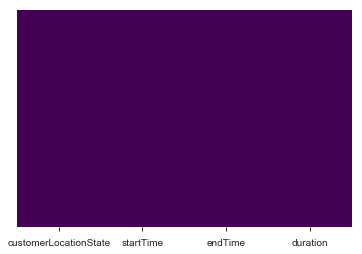

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.heatmap(df.isnull(),cbar=False,yticklabels=False,cmap = 'viridis')

Dataset has no missing values.
If there were any, you would've noticed in figure represented by different colour shade on purple background.
Do try it out with other dataset which has missing values,you'll see the difference.




In [13]:
df.columns

Index(['customerLocationState', 'startTime', 'endTime', 'duration'], dtype='object')

# 3- Data Preparation
#### Tasks
1. Data selection

2. Data preprocessing

   Steps:
   
   Data cleaning
   
   Data integration
   
   Data sampling
   
   Data dimensionality reduction
   
   Data formatting
   
3. Data transformation

   steps:
   
   Scaling
   
   Aggregation
   
   Decomposition
   
   
#### Results 

#### merge "Entrance" and "Livingroom" as single bigger room
   


In [14]:
df.customerLocationState.unique()

array(['bedroom', 'bathroom', 'livingroom', 'entrance', 'unknown',
       'outside', 'unhealthy', 'disabled'], dtype=object)

In [15]:
df['customerLocationState']=df.customerLocationState.str.replace('entrance','bigroom' ).replace('livingroom','bigroom')
df.customerLocationState.unique()

array(['bedroom', 'bathroom', 'bigroom', 'unknown', 'outside',
       'unhealthy', 'disabled'], dtype=object)

#### String to Int 

In [16]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Location'] = le.fit_transform(df['customerLocationState'])
dfLocation = df[['customerLocationState','Location']]
dfLocation.head(2)

,customerLocationState,Location
100,bedroom,1
101,bathroom,0


#### String to index

In [17]:
integer_mapping = {l: i for i, l in enumerate(le.classes_)}
integer_mapping

{'bathroom': 0,
 'bedroom': 1,
 'bigroom': 2,
 'disabled': 3,
 'outside': 4,
 'unhealthy': 5,
 'unknown': 6}

#### Total minutes of traking  in each row 

count    38863.000000
mean        18.028821
std        389.747510
min          0.000000
25%          0.750000
50%          2.633333
75%          9.783333
max      73597.036333
Name: durationMinutes, dtype: float64
we have a positive skewness :174.6578327656563


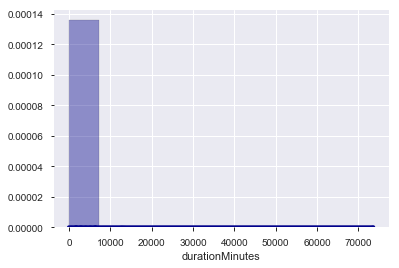

In [18]:
df['durationMinutes'] = df['duration'].dt.total_seconds()/60
print(df.durationMinutes.describe())
print('we have a positive skewness :' + str(df.durationMinutes.skew()))
import seaborn as sns
# Density Plot and Histogram of all durations 
sns.distplot(df['durationMinutes'], hist=True, kde=True, 
             bins=10, color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})


#### Extracting datetime features using datetime module 

In [19]:
import pandas as pd 
# Convert to datetime and extract hour:
df['DateStart'] = pd.to_datetime(df['startTime']).dt.date
df['YearStart'] = pd.to_datetime(df['startTime']).dt.year
df['MonthStart'] = pd.to_datetime(df['startTime']).dt.month
df['weekStart'] = pd.to_datetime(df['startTime']).dt.week
df['DayStart'] = pd.to_datetime(df['startTime']).dt.day
df['WeekYear'] = df['startTime'].apply(lambda x: "%d/%d" % (x.week, x.year))
df['MonthYear'] = df['startTime'].apply(lambda x: "%d/%d" % (x.month, x.year))

# The day of the week with Monday=0, Sunday=6.
df['Dayofweekencoded'] = pd.to_datetime(df['startTime']).dt.dayofweek
df['Dayofweeknames'] = pd.to_datetime(df['startTime']).dt.day_name()
df['TimeStart'] = pd.to_datetime(df['startTime']).dt.time
df['hourStart'] = pd.to_datetime(df['startTime']).dt.hour
df.head(2)

,customerLocationState,startTime,endTime,duration,Location,durationMinutes,DateStart,YearStart,MonthStart,weekStart,DayStart,WeekYear,MonthYear,Dayofweekencoded,Dayofweeknames,TimeStart,hourStart
100,bedroom,2018-06-01 23:34:51+02:00,2018-06-02 00:24:33+02:00,00:49:42,1,49.70,2018-06-01,2018,6,22,1,22/2018,6/2018,4,Friday,23:34:51,23
101,bathroom,2018-06-02 00:24:33+02:00,2018-06-02 00:31:36+02:00,00:07:03,0,7.05,2018-06-02,2018,6,22,2,22/2018,6/2018,5,Saturday,00:24:33,0


#### Sort data by Start time 

In [20]:
df = df.sort_values(by='startTime',ascending=True)


#### Let's show our unique value

In [21]:
print('Hours:' ,df.hourStart.unique())
print("Days names:" , df.Dayofweeknames.unique())
print('DayStart' ,df.DayStart.unique())
print('Years' ,df.YearStart.unique())
print('Month and Year' ,df.MonthYear.unique())
print('num of week for each year:' , df.WeekYear.unique())
print('customerLocationState' , df.customerLocationState.unique())
print('Locations encoded' , df.Location.unique())

Hours: [23  0  8  9 10 11 18 19 20 21 22 12 13 14 17  2 15 16  3  4  7  6  1  5]
Days names: ['Friday' 'Saturday' 'Sunday' 'Monday' 'Tuesday' 'Wednesday' 'Thursday']
DayStart [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]
Years [2018 2019]
Month and Year ['6/2018' '7/2018' '8/2018' '9/2018' '10/2018' '11/2018' '1/2019' '2/2019'
 '3/2019' '4/2019' '5/2019' '6/2019' '7/2019' '8/2019' '9/2019' '10/2019']
num of week for each year: ['22/2018' '23/2018' '24/2018' '25/2018' '26/2018' '27/2018' '28/2018'
 '29/2018' '30/2018' '31/2018' '32/2018' '33/2018' '34/2018' '35/2018'
 '36/2018' '37/2018' '38/2018' '39/2018' '40/2018' '41/2018' '42/2018'
 '43/2018' '44/2018' '45/2018' '46/2018' '47/2018' '2/2019' '3/2019'
 '4/2019' '5/2019' '6/2019' '7/2019' '8/2019' '9/2019' '10/2019' '11/2019'
 '12/2019' '13/2019' '14/2019' '15/2019' '16/2019' '17/2019' '18/2019'
 '19/2019' '20/2019' '21/2019' '22/2019' '23/2019' '24/2019' '25/2019'
 '26/2019' '27/2019'

# Visualizing a time series

Let’s use matplotlib to visualise the series .

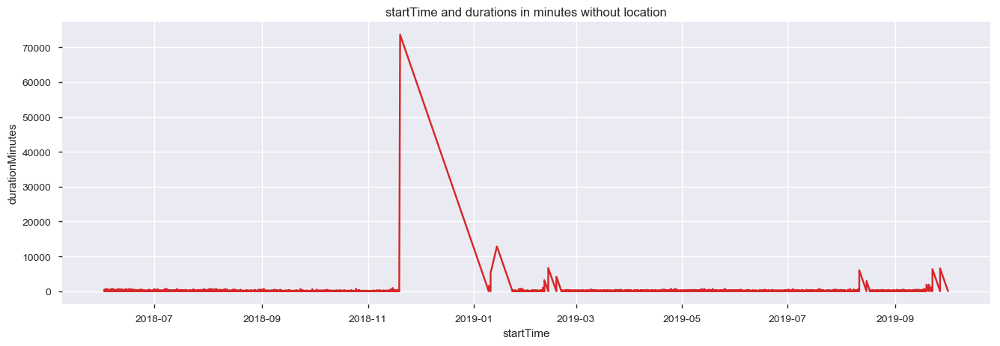

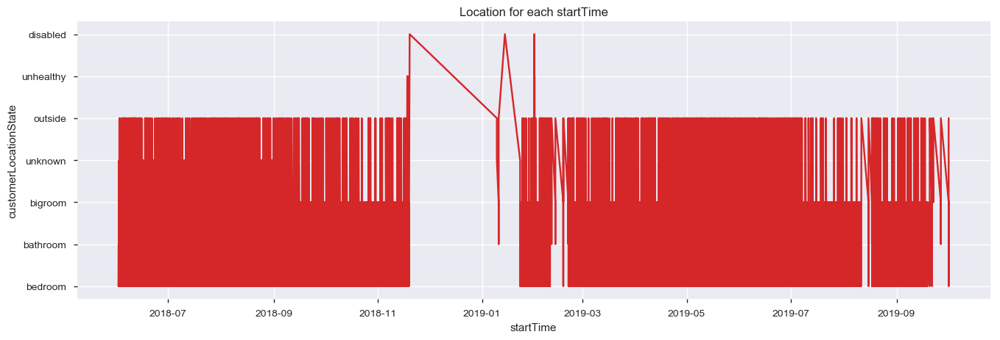

In [22]:
import matplotlib.pyplot as plt

# Draw Plot
def plot_df(df, x, y, title="", xlabel='startTime', ylabel='durationMinutes', dpi=100):
    plt.figure(figsize=(16,5), dpi=dpi)
    plt.plot(x, y, color='tab:red')
    plt.gca().set(title=title, xlabel=xlabel, ylabel=ylabel)
    plt.show()

plot_df(df, x=df.startTime, y=df.durationMinutes, title='startTime and durations in minutes without location')
plot_df(df, x=df.startTime, y=df.customerLocationState, title='Location for each startTime',xlabel='startTime', ylabel='customerLocationState',)


#### Using plotly plot and zoom  :

In [23]:
# Using plotly.express
import plotly.express as px
import pandas as pd
# Using graph_objects
import plotly.graph_objects as go

import pandas as pd
# i will just use 2019 recorded data
dfsep2019=df[(df['YearStart']==2019)& (df['MonthStart']==9)]
#  can zoom and take the duration in each StarTime
fig1 = go.Figure([go.Scatter(x=dfsep2019['startTime'], y=dfsep2019['durationMinutes'])])
#we can show the changement of location in each StarTime
fig2= go.Figure([go.Scatter(x=dfsep2019['startTime'], y=dfsep2019['customerLocationState'])])
fig1.show()
fig2.show()


## EDA
#### Let's look for the count of reported location  each by day , moth , year 
 

               count unique      top  freq
Dayofweeknames                            
Friday          5682      5  bigroom  4330
Monday          5596      6  bigroom  4260
Saturday        5455      5  bigroom  4125
Sunday          5182      6  bigroom  3887
Thursday        5404      7  bigroom  4077
Tuesday         5717      5  bigroom  4341
Wednesday       5828      5  bigroom  4422


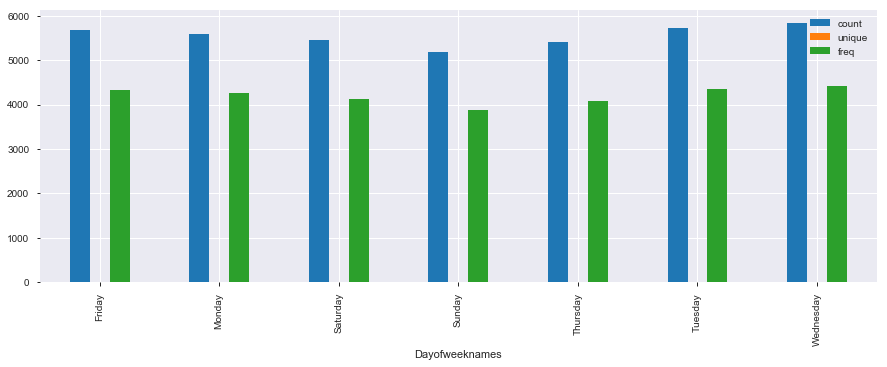

In [24]:
# lets look for the frequencey of each by day  
groupbyday=df.groupby(['Dayofweeknames']).customerLocationState.describe()
print(groupbyday)
groupbyday.plot(kind='bar',figsize=(15, 5))

                                     count unique        top  freq
Dayofweeknames customerLocationState                              
Friday         bathroom                624      1   bathroom   624
               bedroom                 562      1    bedroom   562
               bigroom                4330      1    bigroom  4330
               outside                 102      1    outside   102
               unknown                  64      1    unknown    64
Monday         bathroom                606      1   bathroom   606
               bedroom                 585      1    bedroom   585
               bigroom                4260      1    bigroom  4260
               disabled                  2      1   disabled     2
               outside                  94      1    outside    94
               unknown                  49      1    unknown    49
Saturday       bathroom                646      1   bathroom   646
               bedroom                 540      1    bedroom  

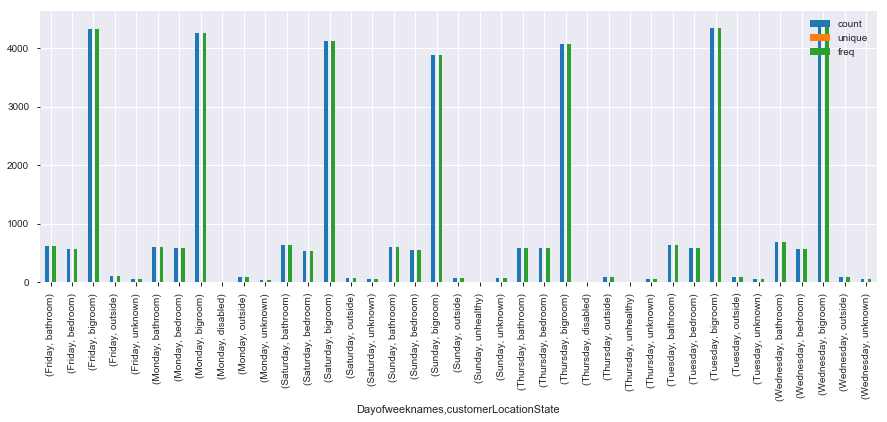

In [25]:
groupbydayandlocation=df.groupby(['Dayofweeknames','customerLocationState']).customerLocationState.describe()
print(groupbydayandlocation)
groupbydayandlocation.plot(kind='bar',figsize=(15, 5))

#### Most Frequent Location 

In [26]:
import seaborn as sns
red= sns.light_palette("red", as_cmap=True)
pd.crosstab(index=df["customerLocationState"],     # Make a crosstab
                      columns="count").style.background_gradient(cmap=red)      # Name the count column

col_0,count
customerLocationState,
bathroom,4395
bedroom,3975
bigroom,29442
disabled,3
outside,624
unhealthy,4
unknown,421


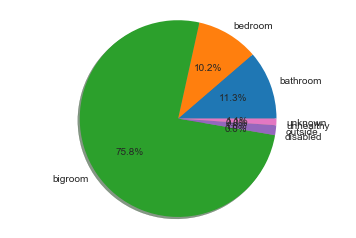

In [27]:
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
labels = df['customerLocationState'].astype('category').cat.categories.tolist()
counts = df['customerLocationState'].value_counts()
sizes = [counts[var_cat] for var_cat in labels]
fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', shadow=True) #autopct is show the % on plot
ax1.axis('equal')
plt.show()

                                       count          mean           std  \
Dayofweeknames customerLocationState                                       
Friday         bathroom                624.0     13.586216     24.011129   
               bedroom                 562.0     59.804877    118.631462   
               bigroom                4330.0      7.443827     15.221552   
               outside                 102.0     91.013725    206.680905   
               unknown                  64.0     28.663923     86.893447   
Monday         bathroom                606.0     11.783654     20.097194   
               bedroom                 585.0     55.634856    111.763098   
               bigroom                4260.0      6.931686     13.511346   
               disabled                  2.0  43229.782492  42945.782235   
               outside                  94.0     88.087943    133.308160   
               unknown                  49.0     48.937755    112.118308   
Saturday    

AxesSubplot(0.125,0.125;0.775x0.755)


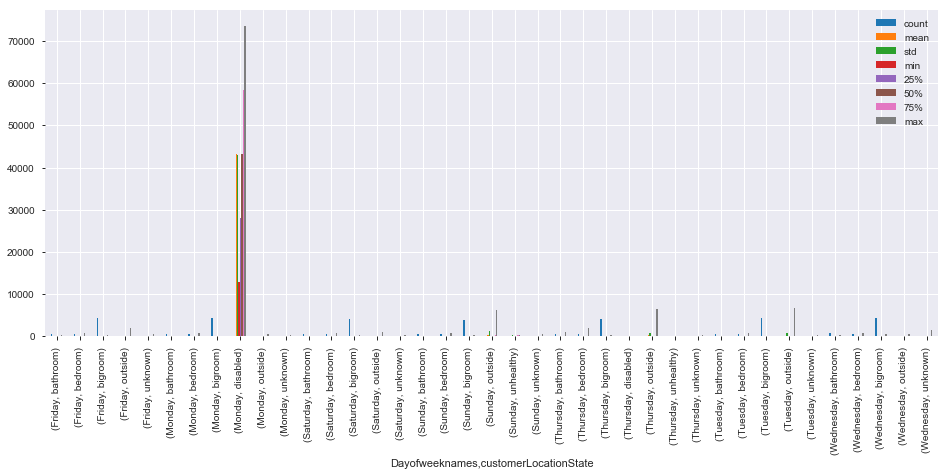

In [28]:
groupbyduration=df.groupby(['Dayofweeknames','customerLocationState'])['durationMinutes'].describe()
print(groupbyduration)
print(groupbyduration.plot.bar(figsize=(16, 6)))

                                              sum                            \
hourStart                                      0            1            2    
Dayofweeknames customerLocationState                                          
Friday         bathroom                 85.915300   263.516667   119.516667   
               bedroom                3818.800000  1669.300000  1801.400000   
               bigroom                 419.968033   267.900000   406.966667   
               outside                        NaN          NaN          NaN   
               unknown                   3.166667          NaN          NaN   
Monday         bathroom                 29.966667    42.416667   128.750000   
               bedroom                1673.616667  2145.818300  3631.016667   
               bigroom                 366.600000   331.883333   291.833333   
               disabled                       NaN          NaN          NaN   
               outside                        NaN   

[[<matplotlib.axes._subplots.AxesSubplot object at 0x0000000015E7E940>


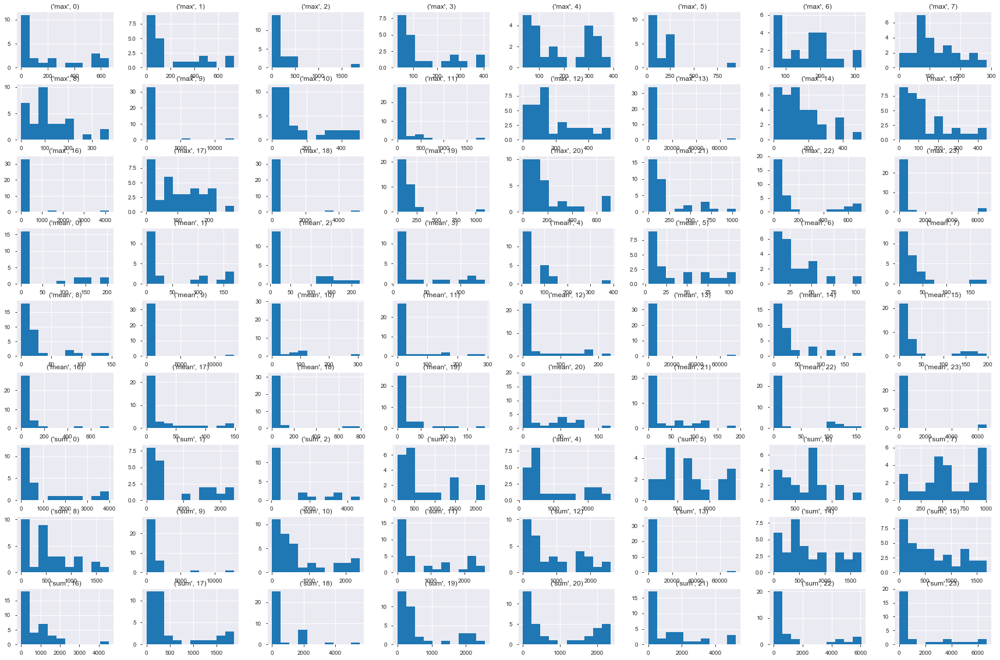

In [29]:
# let's be more precise and look for the frequencey and duration in each hour for each day of week .
DayHourLocationDuration=df.groupby(['Dayofweeknames', 'customerLocationState','hourStart'])['durationMinutes'].agg(['sum', 'mean', 'max']).unstack()
print(DayHourLocationDuration)
print(DayHourLocationDuration.hist(figsize=(30, 20)))
plt.show()

## Data transformation
##### data decomposition: 

In [30]:
df['total_freqbyday'] = df.groupby(['DateStart','customerLocationState'])['customerLocationState'].transform('count')
df['freq_cumbyday'] = df.groupby(['DateStart','customerLocationState'])['customerLocationState'].cumcount()+1
df['freq_cumbyHourofDay'] = df.groupby(['DateStart','customerLocationState','hourStart'])['customerLocationState'].cumcount()+1
df['freq_totalbyHourofDay'] = df.groupby(['DateStart','customerLocationState','hourStart'])['customerLocationState'].transform('count')
df['duration_cumusumbyday'] = df.groupby(['DateStart','customerLocationState'])['durationMinutes'].apply(lambda x: x.cumsum())
df['duration_totalsumbyday'] = df.groupby(['DateStart','customerLocationState'])['durationMinutes'].transform('sum')
dfsort= df.sort_values(by=['DateStart','customerLocationState'],ascending=True)
dfsort[['startTime','hourStart','customerLocationState','freq_cumbyHourofDay','freq_totalbyHourofDay','freq_cumbyday','total_freqbyday','durationMinutes','duration_cumusumbyday','duration_totalsumbyday']].head(10)

,startTime,hourStart,customerLocationState,freq_cumbyHourofDay,freq_totalbyHourofDay,freq_cumbyday,total_freqbyday,durationMinutes,duration_cumusumbyday,duration_totalsumbyday
100,2018-06-01 23:34:51+02:00,23,bedroom,1,1,1,1,49.700000,49.700000,49.700000
101,2018-06-02 00:24:33+02:00,0,bathroom,1,2,1,9,7.050000,7.050000,77.516667
103,2018-06-02 00:32:26+02:00,0,bathroom,2,2,2,9,0.250000,7.300000,77.516667
105,2018-06-02 08:08:18+02:00,8,bathroom,1,4,3,9,1.233333,8.533333,77.516667
107,2018-06-02 08:10:50+02:00,8,bathroom,2,4,4,9,3.316667,11.850000,77.516667
109,2018-06-02 08:18:47+02:00,8,bathroom,3,4,5,9,0.500000,12.350000,77.516667
113,2018-06-02 08:39:55+02:00,8,bathroom,4,4,6,9,5.166667,17.516667,77.516667
119,2018-06-02 10:30:09+02:00,10,bathroom,1,1,7,9,16.300000,33.816667,77.516667
133,2018-06-02 19:35:57+02:00,19,bathroom,1,1,8,9,41.783333,75.600000,77.516667
137,2018-06-02 20:33:07+02:00,20,bathroom,1,1,9,9,1.916667,77.516667,77.516667


### Data analysis after feautres extracing and  decomposition 
### Two-Way Tables
Two-way frequency tables, also called contingency tables, are tables of counts with two dimensions where each dimension is a different variable. Two-way tables can give you insight into the relationship between two variables. To create a two way table, pass two variables to the pd.crosstab() function instead of one:
##### location vs hour of day 
Lets's take a look of the frequecy of each location in each hour of the day :

In [31]:
import seaborn as sns
df['hourstrinng']=df['hourStart'].apply(str)
orange = sns.light_palette("orange", as_cmap=True)
freqhourofday=pd.crosstab(index=df['customerLocationState'],columns=df['hourstrinng'] 
                          ,margins=True)  
# Include row and column totals
freqhourofday.columns = ['1' ,'2' ,'3' ,'4', '5', '6', '7' ,'8' ,'9','10', '11', '12', '13', '14', '15', '16' ,'17', '18','19', '20','21', '22','23','24',"RowLocationFrequency"]
freqhourofday.index= ['bedroom', 'bathroom', 'bigroom', 'unknown', 'outside',
       'unhealthy', 'disabled','ColHourLocationFrequency']
freqhourofday

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,RowLocationFrequency
bedroom,64,52,299,240,228,184,178,167,177,198,...,215,116,98,109,105,127,166,292,305,4395
bathroom,123,98,239,206,125,162,154,157,147,136,...,291,209,110,127,88,98,154,207,256,3975
bigroom,309,257,2539,2207,1590,1442,1376,1286,1293,1483,...,1197,622,433,478,511,735,899,1438,1803,29442
unknown,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,1,3
outside,0,0,115,60,48,46,47,45,51,22,...,11,3,0,0,0,0,4,15,59,624
unhealthy,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,4
disabled,2,1,34,23,31,21,12,22,27,23,...,39,15,0,0,0,2,5,17,30,421
ColHourLocationFrequency,498,408,3227,2736,2022,1856,1767,1678,1695,1862,...,1753,965,641,715,704,962,1228,1969,2454,38864


### To get the total proportion of frequency in each cell, divide the table by the grand total:

In [32]:
freqhourofday/freqhourofday.loc["ColHourLocationFrequency","RowLocationFrequency"]

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,RowLocationFrequency
bedroom,0.001647,0.001338,0.007693,0.006175,0.005867,0.004734,0.004580,0.004297,0.004554,0.005095,...,0.005532,0.002985,0.002522,0.002805,0.002702,0.003268,0.004271,0.007513,0.007848,0.113087
bathroom,0.003165,0.002522,0.006150,0.005301,0.003216,0.004168,0.003963,0.004040,0.003782,0.003499,...,0.007488,0.005378,0.002830,0.003268,0.002264,0.002522,0.003963,0.005326,0.006587,0.102280
bigroom,0.007951,0.006613,0.065330,0.056788,0.040912,0.037104,0.035406,0.033090,0.033270,0.038159,...,0.030800,0.016005,0.011141,0.012299,0.013148,0.018912,0.023132,0.037001,0.046393,0.757565
unknown,0.000000,0.000000,0.000000,0.000000,0.000000,0.000026,0.000000,0.000026,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000026,0.000077
outside,0.000000,0.000000,0.002959,0.001544,0.001235,0.001184,0.001209,0.001158,0.001312,0.000566,...,0.000283,0.000077,0.000000,0.000000,0.000000,0.000000,0.000103,0.000386,0.001518,0.016056
unhealthy,0.000000,0.000000,0.000026,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000026,0.000000,0.000000,0.000000,0.000000,0.000000,0.000103
disabled,0.000051,0.000026,0.000875,0.000592,0.000798,0.000540,0.000309,0.000566,0.000695,0.000592,...,0.001003,0.000386,0.000000,0.000000,0.000000,0.000051,0.000129,0.000437,0.000772,0.010833
ColHourLocationFrequency,0.012814,0.010498,0.083033,0.070399,0.052028,0.047756,0.045466,0.043176,0.043614,0.047911,...,0.045106,0.024830,0.016493,0.018397,0.018114,0.024753,0.031597,0.050664,0.063143,1.000000


### To get the proportion of counts along each column  divide by the column totals:

In [33]:
freqhourofday/freqhourofday.loc["ColHourLocationFrequency"]

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,RowLocationFrequency
bedroom,0.128514,0.127451,0.092656,0.087719,0.112760,0.099138,0.100736,0.099523,0.104425,0.106337,...,0.122647,0.120207,0.152886,0.152448,0.149148,0.132017,0.135179,0.148299,0.124287,0.113087
bathroom,0.246988,0.240196,0.074063,0.075292,0.061820,0.087284,0.087153,0.093564,0.086726,0.073040,...,0.166001,0.216580,0.171607,0.177622,0.125000,0.101871,0.125407,0.105130,0.104319,0.102280
bigroom,0.620482,0.629902,0.786799,0.806652,0.786350,0.776940,0.778721,0.766389,0.762832,0.796455,...,0.682829,0.644560,0.675507,0.668531,0.725852,0.764033,0.732085,0.730320,0.734719,0.757565
unknown,0.000000,0.000000,0.000000,0.000000,0.000000,0.000539,0.000000,0.000596,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000407,0.000077
outside,0.000000,0.000000,0.035637,0.021930,0.023739,0.024784,0.026599,0.026818,0.030088,0.011815,...,0.006275,0.003109,0.000000,0.000000,0.000000,0.000000,0.003257,0.007618,0.024042,0.016056
unhealthy,0.000000,0.000000,0.000310,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.001399,0.000000,0.000000,0.000000,0.000000,0.000000,0.000103
disabled,0.004016,0.002451,0.010536,0.008406,0.015331,0.011315,0.006791,0.013111,0.015929,0.012352,...,0.022248,0.015544,0.000000,0.000000,0.000000,0.002079,0.004072,0.008634,0.012225,0.010833
ColHourLocationFrequency,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


To get the proportion of counts along each row divide by the row totals. The division operator functions on a row-by-row basis when used on DataFrames by default. In this case we want to divide each column by the rowtotals column. To get division to work on a column by column basis, use df.div() with the axis set to 0 (or "index"):

In [34]:
freqhourofday.div(freqhourofday["RowLocationFrequency"],
                   axis=0)

,1,2,3,4,5,6,7,8,9,10,...,16,17,18,19,20,21,22,23,24,RowLocationFrequency
bedroom,0.014562,0.011832,0.068032,0.054608,0.051877,0.041866,0.040501,0.037998,0.040273,0.045051,...,0.048919,0.026394,0.022298,0.024801,0.023891,0.028896,0.037770,0.066439,0.069397,1.0
bathroom,0.030943,0.024654,0.060126,0.051824,0.031447,0.040755,0.038742,0.039497,0.036981,0.034214,...,0.073208,0.052579,0.027673,0.031950,0.022138,0.024654,0.038742,0.052075,0.064403,1.0
bigroom,0.010495,0.008729,0.086237,0.074961,0.054004,0.048978,0.046736,0.043679,0.043917,0.050370,...,0.040656,0.021126,0.014707,0.016235,0.017356,0.024964,0.030535,0.048842,0.061239,1.0
unknown,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.333333,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,1.0
outside,0.000000,0.000000,0.184295,0.096154,0.076923,0.073718,0.075321,0.072115,0.081731,0.035256,...,0.017628,0.004808,0.000000,0.000000,0.000000,0.000000,0.006410,0.024038,0.094551,1.0
unhealthy,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0
disabled,0.004751,0.002375,0.080760,0.054632,0.073634,0.049881,0.028504,0.052257,0.064133,0.054632,...,0.092637,0.035629,0.000000,0.000000,0.000000,0.004751,0.011876,0.040380,0.071259,1.0
ColHourLocationFrequency,0.012814,0.010498,0.083033,0.070399,0.052028,0.047756,0.045466,0.043176,0.043614,0.047911,...,0.045106,0.024830,0.016493,0.018397,0.018114,0.024753,0.031597,0.050664,0.063143,1.0


### let's show the highest  values 

In [35]:
red = sns.light_palette("red", as_cmap=True)
Location_Hour_cumfrequecy = pd.crosstab(index=df["customerLocationState"], 
                             columns=[df["hourstrinng"],
                                      df["freq_totalbyHourofDay"]],
                             margins=True)  # Include row and column totals

Location_Hour_cumfrequecy.style.background_gradient(cmap=red)

### let's show the count  of freq in hour 3 

In [36]:
pd.crosstab(index=df["customerLocationState"], 
                             columns=[df["hourstrinng"],
                                      df["freq_totalbyHourofDay"]],
                             margins=True)['3'].style.background_gradient(cmap=red)       # Get the subtable under hour 3

freq_totalbyHourofDay,1,2,3,4,5,6,7,8,9,10,12
customerLocationState,,,,,,,,,,,
bathroom,55,32,3,8,0,0,0,0,0,0,0
bedroom,69,34,3,4,0,0,0,0,0,0,0
bigroom,31,38,69,76,65,48,35,40,9,10,12
disabled,0,0,0,0,0,0,0,0,0,0,0
outside,0,0,0,0,0,0,0,0,0,0,0
unhealthy,0,0,0,0,0,0,0,0,0,0,0
unknown,0,0,0,0,0,0,0,0,0,0,0
All,155,104,75,88,65,48,35,40,9,10,12


### Get count of freq"4" 

In [37]:
pd.crosstab(index=df["customerLocationState"], 
                             columns=[df["hourstrinng"],
                                      df["freq_totalbyHourofDay"]],
                             margins=True)['3'][4] 

customerLocationState
bathroom      8
bedroom       4
bigroom      76
disabled      0
outside       0
unhealthy     0
unknown       0
All          88
Name: 4, dtype: int64


Due to the convenient hierarchical structure of the table, we still use one division to get the proportion of survival across each column:


In [38]:
H=Location_Hour_cumfrequecy/Location_Hour_cumfrequecy.loc["All"] # Divide by column totals
H.style.background_gradient(cmap=red)

This table is so important to have an idea of the frequecy of location  in each hour 
so let's create onother feautres event that describe the chagement of location 
and look for the frequency of event for each hour and for each day 

In [39]:
import numpy as np

df['event']= np.where((df['customerLocationState']!=df['customerLocationState'].shift())
                      ,df['customerLocationState'].shift()+' to '+df['customerLocationState'],'nochange')
df[['customerLocationState','event']].head(3)

,customerLocationState,event
100,bedroom,NaN
101,bathroom,bedroom to bathroom
102,bedroom,bathroom to bedroom


In [40]:
la=LabelEncoder()
df=df.dropna()
df=df.drop_duplicates()
df['eventcoded'] = la.fit_transform(df['event'])
integer_mapping = {l: i for i, l in enumerate(la.classes_)}
integer_mapping

{'bathroom to bedroom': 0,
 'bathroom to bigroom': 1,
 'bathroom to outside': 2,
 'bathroom to unknown': 3,
 'bedroom to bathroom': 4,
 'bedroom to bigroom': 5,
 'bedroom to disabled': 6,
 'bedroom to outside': 7,
 'bedroom to unknown': 8,
 'bigroom to bathroom': 9,
 'bigroom to bedroom': 10,
 'bigroom to disabled': 11,
 'bigroom to outside': 12,
 'bigroom to unhealthy': 13,
 'bigroom to unknown': 14,
 'disabled to bigroom': 15,
 'disabled to outside': 16,
 'disabled to unknown': 17,
 'nochange': 18,
 'outside to bathroom': 19,
 'outside to bedroom': 20,
 'outside to bigroom': 21,
 'outside to disabled': 22,
 'outside to unknown': 23,
 'unhealthy to bigroom': 24,
 'unknown to bathroom': 25,
 'unknown to bedroom': 26,
 'unknown to bigroom': 27,
 'unknown to outside': 28}

In [41]:
import seaborn as sns
red= sns.light_palette("red", as_cmap=True)
pd.crosstab(index=df["event"],     # Make a crosstab
                      columns="count").style.background_gradient(cmap=red)      # Name the count column

col_0,count
event,
bathroom to bedroom,290
bathroom to bigroom,4052
bathroom to outside,21
bathroom to unknown,1
bedroom to bathroom,557
bedroom to bigroom,3337
bedroom to disabled,1
bedroom to outside,2
bedroom to unknown,19


In [42]:
pd.crosstab(index=df["customerLocationState"], 
                             columns=[df["Dayofweeknames"],
                                      df["event"]],
                             margins=True).style.background_gradient(cmap=red)  

#### Chi_Square_Test
There are two types of chi-square tests. Both use the chi-square statistic and distribution for different purposes:

    A chi-square goodness of fit test determines if a sample data matches a population.
    
    A chi-square test for independence compares two variables in a contingency table to see if they are related. In a more general sense, it tests to see whether distributions of categorical variables differ from each another.
    
**A very small chi square test statistic means that your observed data fits your expected data extremely well. In other words, there is a relationship.**

**A very large chi square test statistic means that the data does not fit very well. In other words, there isn’t a relationship.**

**The H0 (Null Hypothesis)**: There is no relationship between variable one and variable two.

**The H1 (Alternative Hypothesis)**: There is a relationship between variable 1 and variable 2.

If the **p-value** is significant, you can reject the null hypothesis and claim that the findings support the alternative hypothesis.

let's propose **a=0.05**

**If p-value < a, reject H0**

**If p-value >a, fail to reject H0**

In [43]:
import pandas
from scipy.stats import chi2_contingency
c, p, dof, expected =chi2_contingency(pd.crosstab(index=df['customerLocationState'],columns=df['hourstrinng']))
print('chi square test statistic:'+ str(c))
print('p-value:'+ str(p))
print('Degree of Freedom:' + str(dof))
print(f"Chi2 result of the contingency table: {c}, p-value: {p}")

chi square test statistic:1367.9030744594436
p-value:2.4905040923643917e-201
Degree of Freedom:138
Chi2 result of the contingency table: 1367.9030744594436, p-value: 2.4905040923643917e-201


The first value (1370.4496159394635) is the Chi-square value, followed by the p-value (7.909533927655173e-202), then comes the degrees of freedom (138), and lastly it outputs the expected frequencies as an array"not shown here". Since all of the expected frequencies are greater than 5, the chi2 test results can be trusted. We can reject the null hypothesis as the p-value is less than 0.05. Thus, the results indicate that there is a relationship between Location and hour start in a location 
Although our Chi-square test was signficant,we have an relation for many reasons :

Since p-value < 0.05 we reject the null hypothesis, we can conclude that Location and hour start are dependent. 
The Chi-square value is 1367.9030744594436  which is relativly high. The p-value is 2.4905040923643917e-201 which is so  small. 

In [44]:
import pandas
from scipy.stats import chi2_contingency
c1, p1, dof1, expected1 =chi2_contingency(pd.crosstab(index=df['customerLocationState'],columns=df['Dayofweeknames']))
print('chi square test statistic:'+ str(c1))
print('p-value:'+ str(p1))
print('Degree of Freedom:' + str(dof1))

chi square test statistic:43.676161590645705
p-value:0.17756410638007947
Degree of Freedom:36


In [45]:
import pandas
from scipy.stats import chi2_contingency
c11, p11, dof11, expected11 =chi2_contingency(pd.crosstab(index=df['customerLocationState'],columns=df['Dayofweeknames']))
print('chi square test statistic:'+ str(c11))
print('p-value:'+ str(p11))
print('Degree of Freedom:' + str(dof11))

chi square test statistic:43.676161590645705
p-value:0.17756410638007947
Degree of Freedom:36


In [46]:
import pandas
from scipy.stats import chi2_contingency
c11, p11, dof11, expected11 =chi2_contingency(pd.crosstab(index=df['customerLocationState'],columns=df['customerLocationState'].shift()))
print('chi square test statistic:'+ str(c11))
print('p-value:'+ str(p11))
print('Degree of Freedom:' + str(dof11))

chi square test statistic:233166.00000000003
p-value:0.0
Degree of Freedom:36


In [47]:
import pandas
from scipy.stats import chi2_contingency
c11, p11, dof11, expected11 =chi2_contingency(pd.crosstab(index=df['customerLocationState'],columns=df['duration_cumusumbyday']))
print('chi square test statistic:'+ str(c11))
print('p-value:'+ str(p11))
print('Degree of Freedom:' + str(dof11))

chi square test statistic:195997.5131640432
p-value:1.356192532694136e-08
Degree of Freedom:192528


In [48]:
### So let's explore the time where we have an incident :

In [49]:
# let's only show data for 2019
import plotly.express as px
df2019=df.loc[df['YearStart']==2019]
fig = px.bar(df2019, x="customerLocationState", y="durationMinutes", color="customerLocationState",
  animation_frame="MonthStart", animation_group="customerLocationState")
fig.show()

In [50]:
from datetime import datetime, timedelta,date
start_date = date(2019,9,18)
end_date = date(2019,9,19)
dfincident=df.loc[df['DateStart'].between(start_date,end_date)] 
dfincident= dfincident.sort_values(by='startTime',ascending=True)
dfincident.tail(20)

,customerLocationState,startTime,endTime,duration,Location,durationMinutes,DateStart,YearStart,MonthStart,weekStart,...,hourStart,total_freqbyday,freq_cumbyday,freq_cumbyHourofDay,freq_totalbyHourofDay,duration_cumusumbyday,duration_totalsumbyday,hourstrinng,event,eventcoded
38867,bigroom,2019-09-18 16:59:20+02:00,2019-09-18 17:44:01+02:00,0 days 00:44:41,2,44.683333,2019-09-18,2019,9,38,...,16,64,52,7,7,516.850000,652.733333,16,nochange,18
38868,bigroom,2019-09-18 17:44:01+02:00,2019-09-18 18:01:59+02:00,0 days 00:17:58,2,17.966667,2019-09-18,2019,9,38,...,17,64,53,1,1,534.816667,652.733333,17,nochange,18
38869,bigroom,2019-09-18 18:01:59+02:00,2019-09-18 18:05:04+02:00,0 days 00:03:05,2,3.083333,2019-09-18,2019,9,38,...,18,64,54,1,5,537.900000,652.733333,18,nochange,18
38870,bigroom,2019-09-18 18:05:04+02:00,2019-09-18 18:14:20+02:00,0 days 00:09:16,2,9.266667,2019-09-18,2019,9,38,...,18,64,55,2,5,547.166667,652.733333,18,nochange,18
38871,bigroom,2019-09-18 18:14:20+02:00,2019-09-18 18:32:10+02:00,0 days 00:17:50,2,17.833333,2019-09-18,2019,9,38,...,18,64,56,3,5,565.000000,652.733333,18,nochange,18
38872,bedroom,2019-09-18 18:32:10+02:00,2019-09-18 18:38:48+02:00,0 days 00:06:38,1,6.633333,2019-09-18,2019,9,38,...,18,5,3,1,1,22.350000,410.800000,18,bigroom to bedroom,10
38873,bigroom,2019-09-18 18:38:48+02:00,2019-09-18 18:39:42+02:00,0 days 00:00:54,2,0.900000,2019-09-18,2019,9,38,...,18,64,57,4,5,565.900000,652.733333,18,bedroom to bigroom,5
38874,bigroom,2019-09-18 18:39:42+02:00,2019-09-18 19:36:15+02:00,0 days 00:56:33,2,56.550000,2019-09-18,2019,9,38,...,18,64,58,5,5,622.450000,652.733333,18,nochange,18
38875,bigroom,2019-09-18 19:36:15+02:00,2019-09-18 20:01:32+02:00,0 days 00:25:17,2,25.283333,2019-09-18,2019,9,38,...,19,64,59,1,1,647.733333,652.733333,19,nochange,18
38876,bigroom,2019-09-18 20:01:32+02:00,2019-09-18 20:02:11+02:00,0 days 00:00:39,2,0.650000,2019-09-18,2019,9,38,...,20,64,60,1,5,648.383333,652.733333,20,nochange,18


As we see he wake up at  02:43:43+02:00b and he relax at the bigroom and return again to the bathrom , so we can conlude here that he have a problem that wake him and not just a normal behavior .
Also at 10 go to the bathrom and return to the big room , unusal event happen .

        

In [51]:
import plotly.express as px

fig = px.scatter(dfincident, x="TimeStart", y="durationMinutes", facet_row="DayStart", facet_col="customerLocationState",
                 color="customerLocationState", trendline="durationMinutes")
fig.show()

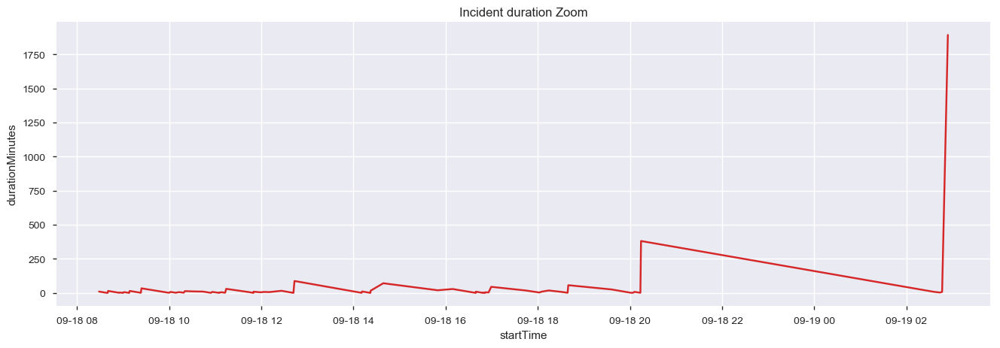

In [53]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=dfsep2019['startTime'], y=dfsep2019['durationMinutes'], name="Normal behavior",
                         line_color='deepskyblue'))

fig.add_trace(go.Scatter(x=dfincident.startTime, y=dfincident.durationMinutes, name="Incident Time",
                         line_color='red'))

fig.update_layout(title_text="Manually Set Date Range",
                  xaxis_rangeslider_visible=False)

fig.show()
plot_df(dfincident, x=dfincident.startTime, y=dfincident.durationMinutes, title='Incident duration Zoom')

#### zoom and take a look of what happen : location+starTime+duration

In [55]:
import plotly.offline as py
import plotly.graph_objs as go


x=dfincident.startTime.values
y=dfincident.customerLocationState.values
z=dfincident.durationMinutes.values
h=dfincident.DayStart.values
trace = go.Scatter3d(
    mode = 'lines+markers',
     text=h,
    x=x, y=y, z=z,
    marker=dict(
        size=4,
        color=z,
        colorscale='Viridis',
    ),
    line=dict(
        color='#1f77b4',
        width=4
    )
)

data = [trace]

layout = dict(
    width=800,
    height=700,
    autosize=False,
    title='tracking of our patient In the incident time  ',
    scene=dict(
        
        xaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        yaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        zaxis=dict(
            gridcolor='rgb(255, 255, 255)',
            zerolinecolor='rgb(255, 255, 255)',
            showbackground=True,
            backgroundcolor='rgb(230, 230,230)'
        ),
        camera=dict(
            up=dict(
                x=0,
                y=0,
                z=1
            ),
            eye=dict(
                x=-2,
                y=2,
                z=2,
            )
        ),
        aspectratio = dict( x=1, y=1, z=0.7 ),
        aspectmode = 'manual'
    ),
)

fig = dict(data=data, layout=layout)

py.iplot(fig, filename='incidenttime3d')

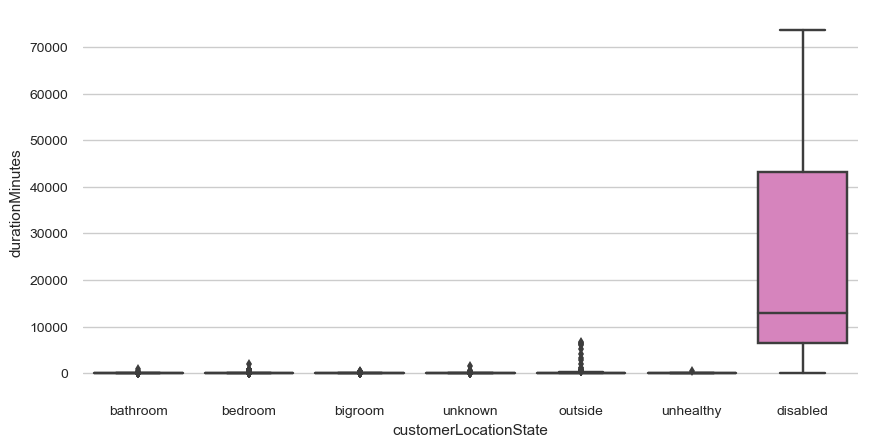

In [56]:
import seaborn as sns 
plt.figure(figsize=(10,5), dpi=100)
sns.set_style("whitegrid") 
sns.boxplot(x = 'customerLocationState', y = 'durationMinutes', data = df) 

# Result of EDA:
-correllation between hour start and frequence of location 

-Our patient has a routine behavior  and spend the most of time in the bigroom and  bedroom.

-Some times our patient go outside

==> our anomly behavior will be based on 'frequence  of location , hour start , change of event and many more .

==> we will enhance our analysis by doing others analysis before modeling our solutions . 
